<a href="https://colab.research.google.com/github/mac-raj/Amazon-Fine-Food-Reviews-Analysis/blob/main/BYE_WORLD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Collection

In this project, we will use Reddit's API to gather posts from two subreddits, "r/depression" and "r/SuicideWatch." Our goal is to automate as much of this process as possible

In [1]:
import pandas as pd
import requests
import time 
from random import randint

We will investigate the HTML structure of the r/depression subreddit page. Our aim is to gain an understanding of its layout and design. By examining the HTML architecture, we can determine the elements and tags used to structure the content on the page. This will help us to develop a clearer picture of how the subreddit is constructed and how we can navigate it more effectively.

In [2]:
# WE WILL SCRAPE THE r/depression AND r/SuicideWatch SUBREDDITS
url_1 = "https://www.reddit.com/r/depression.json"
headers = {"User-agent" : "Raj"}
res = requests.get(url_1, headers=headers)
res.status_code

200

In [3]:
#PEEKING AT WHAT OUR DATA WILL LOOK LIKE
depress_json = res.json()
depress_json

{'kind': 'Listing',
 'data': {'after': 't3_12qkqre',
  'dist': 27,
  'modhash': '',
  'geo_filter': None,
  'children': [{'kind': 't3',
    'data': {'approved_at_utc': None,
     'subreddit': 'depression',
     'selftext': 'Welcome to /r/depression\'s check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn\'t be standalone posts in the sub as they violate the "role model" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\n-----\n\nOur subreddit rules are located in the sidebar (you can also always access them at https://www.reddit.com/r/depression/about/rules) - since all of them exist for important safety reasons, we ask everyone here to read and follow them. Please click \'report\' on any harmful content you see here - we always want to know and deal as soon as we can.\n\nWe also have several wikis there fo

In [4]:
#THE REDDIT DATA SEEMS TO BE ORGANISED AS A DICTIONARY
#LET'S GET ITS KEYS
keys = sorted(depress_json["data"].keys())
keys

['after', 'before', 'children', 'dist', 'geo_filter', 'modhash']

In [5]:
for key in keys:
  print(depress_json["data"][str(key)])

t3_12qkqre
None
[{'kind': 't3', 'data': {'approved_at_utc': None, 'subreddit': 'depression', 'selftext': 'Welcome to /r/depression\'s check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn\'t be standalone posts in the sub as they violate the "role model" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\n-----\n\nOur subreddit rules are located in the sidebar (you can also always access them at https://www.reddit.com/r/depression/about/rules) - since all of them exist for important safety reasons, we ask everyone here to read and follow them. Please click \'report\' on any harmful content you see here - we always want to know and deal as soon as we can.\n\nWe also have several wikis there for help with finding and giving support:\n\nhttps://www.reddit.com/r/depression/wiki/what_is_depression provides guidan

In [6]:
# CONFIRMING THAT THE PREVIOUS AFTER KEY IS REALLY THE LAST ITEM ON OUR PAGE
[post["data"]["name"] for post in depress_json["data"]["children"]]


['t3_11vys6c',
 't3_doqwow',
 't3_12qchw8',
 't3_12qjstk',
 't3_12qii5d',
 't3_12qhrij',
 't3_12pog07',
 't3_12qnnkl',
 't3_12qosp4',
 't3_12qko89',
 't3_12qpalk',
 't3_12q8gnm',
 't3_12qvpce',
 't3_12qntlj',
 't3_12qlosp',
 't3_12qk9qd',
 't3_12qu2kl',
 't3_12qp5i5',
 't3_12qhipl',
 't3_12qkv71',
 't3_12qfk9t',
 't3_12qrmtg',
 't3_12qk2xy',
 't3_12qius6',
 't3_12qis8s',
 't3_12qn67k',
 't3_12qkqre']

In [7]:
# TOTAL NUMBER OF POST IN ONE SUBREDDIT PAGE
len(depress_json["data"]["children"]) 

27

In [8]:
# A LOT LIKE THIS DATA IS ACTUALLY WHAT WE NEED
depress_json["data"]["children"][0]["data"]

{'approved_at_utc': None,
 'subreddit': 'depression',
 'selftext': 'Welcome to /r/depression\'s check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn\'t be standalone posts in the sub as they violate the "role model" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\n-----\n\nOur subreddit rules are located in the sidebar (you can also always access them at https://www.reddit.com/r/depression/about/rules) - since all of them exist for important safety reasons, we ask everyone here to read and follow them. Please click \'report\' on any harmful content you see here - we always want to know and deal as soon as we can.\n\nWe also have several wikis there for help with finding and giving support:\n\nhttps://www.reddit.com/r/depression/wiki/what_is_depression provides guidance about what is and isn\'t a depressi

In [9]:
# CONVERT INTO DATAFRAME
pd.DataFrame(depress_json["data"]["children"])

,kind,data
0,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
1,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
2,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
3,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
4,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
5,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
6,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
7,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
8,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."
9,t3,"{'approved_at_utc': None, 'subreddit': 'depres..."


**Creating funciton to help the data collection process be automated**

In [10]:
# NOW WE CAN BUILD A FUNCTION THAT CAN SCRAPE A REDDIT PAGE
def reddit_scrape(url_string, number_of_scrapes, output_list):
    #SCRAPED POSTS WILL BE CONTAINED IN OUTPUT LIST(SHD BE EMPTY)
    #THIS IS USEFUL FOR THE FIRST SCRAPE FROM THE VIRGIN SUBREDDIT
    after = None 
    for _ in range(number_of_scrapes):
        if _ == 0:
            print("SCRAPING {}\n--------------------------------------------------".format(url_string))
            print("<<<SCRAPING COMMENCED>>>") 
            print("Downloading Batch {} of {}...".format(1, number_of_scrapes))
        elif (_+1) % 5 ==0:
            print("Downloading Batch {} of {}...".format((_ + 1), number_of_scrapes))
        
        if after == None:
            params = {}
        else:
            #THIS WILL TELL THE SCRAPER TO GET THE NEXT SET AFTER REDDIT'S after CODE
            params = {"after": after}             
        res = requests.get(url_string, params=params, headers=headers)
        if res.status_code == 200:
            the_json = res.json()
            output_list.extend(the_json["data"]["children"])
            after = the_json["data"]["after"]
        else:
            print(res.status_code)
            break
        time.sleep(randint(1,6))
    
    print("<<<SCRAPING COMPLETED>>>")
    print("Number of posts downloaded: {}".format(len(output_list)))
    print("Number of unique posts: {}".format(len(set([p["data"]["name"] for p in output_list]))))
 

In [11]:
#CALLING THE FUNCTION ON OUR DEPRESSION SUBREDDIT
depress_scraped = [] #DEFINING AN EMPTY LIST THAT WILL CONTAIN OUR SCRAPED DATA
reddit_scrape("https://www.reddit.com/r/depression.json", 100, depress_scraped)

SCRAPING https://www.reddit.com/r/depression.json
--------------------------------------------------
<<<SCRAPING COMMENCED>>>
<<<SCRAPING COMPLETED>>>
Number of posts downloaded: 2465
Number of unique posts: 957


In [12]:
#CREATING A FUNCTION TO OUTPUT A LIST OF ONLY UNIQUE POSTS
def create_unique_list(original_scrape_list, new_list_name):
    data_name_list=[]
    for i in range(len(original_scrape_list)):
        if original_scrape_list[i]["data"]["name"] not in data_name_list:
            new_list_name.append(original_scrape_list[i]["data"])
            data_name_list.append(original_scrape_list[i]["data"]["name"])
    #CHECKING IF THE NEW LIST IS OF SAME LENGTH AS UNIQUE POSTS
    print("LIST NOW CONTAINS {} UNIQUE SCRAPED POSTS".format(len(new_list_name)))

In [13]:
#CALLING THE FUNCTION TO OUR SCRAPED DATA AND CONVERTING IT INTO A DATAFRAME 
depress_scraped_unique = []
create_unique_list(depress_scraped, depress_scraped_unique)
depression = pd.DataFrame(depress_scraped_unique)
depression["is_suicide"] = 0
depression.head()

LIST NOW CONTAINS 957 UNIQUE SCRAPED POSTS


,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,...,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,author_cakeday,is_suicide
0,None,depression,Welcome to /r/depression's check-in post - a p...,t2_64qjj,False,None,0,False,"Regular check-in post, with information about ...",[],...,None,True,https://www.reddit.com/r/depression/comments/1...,952572,1.679262e+09,0,None,False,NaN,0
1,None,depression,We understand that most people who reply immed...,t2_1t70,False,None,3,False,Our most-broken and least-understood rules is ...,[],...,None,True,https://www.reddit.com/r/depression/comments/d...,952572,1.572361e+09,2,None,False,NaN,0
2,None,depression,Best part about being asleep is that you can’t...,t2_9e9t71p28,False,None,0,False,I sleep a lot when I’m super depressed to avoi...,[],...,None,False,https://www.reddit.com/r/depression/comments/1...,952572,1.681797e+09,0,None,False,NaN,0
3,None,depression,"I won't go into detail, but I've wasted my pot...",t2_gkv6dg6t,False,None,0,False,I hate when relatives ask about me/acknowledge...,[],...,None,False,https://www.reddit.com/r/depression/comments/1...,952572,1.681817e+09,0,None,False,NaN,0
4,None,depression,"My death would fuck them up, especially if I h...",t2_9e9t71p28,False,None,0,False,I hesitate to form close bonds with people jus...,[],...,None,False,https://www.reddit.com/r/depression/comments/1...,952572,1.681813e+09,0,None,False,NaN,0


**Running our functions on the r/SuicideWatch subreddit**

In [14]:
#CALLING THE SCRAPING FUNCTION ON OUR SUICIDEWATCH SUBREDDIT
suicide_scraped = [] #DEFINING AN EMPTY LIST THAT WILL CONTAIN OUR SCRAPED DATA
reddit_scrape("https://www.reddit.com/r/SuicideWatch.json", 100, suicide_scraped)

SCRAPING https://www.reddit.com/r/SuicideWatch.json
--------------------------------------------------
<<<SCRAPING COMMENCED>>>
<<<SCRAPING COMPLETED>>>
Number of posts downloaded: 2457
Number of unique posts: 978


In [15]:
#CALLING THE FUNCTION TO OUR SCRAPED SUICIDEWATCH DATA AND CONVERTING IT INTO A DATAFRAME
suicide_scraped_unique = []
create_unique_list(suicide_scraped, suicide_scraped_unique)
suicide_watch = pd.DataFrame(suicide_scraped_unique)
suicide_watch["is_suicide"] = 1
suicide_watch.head()

LIST NOW CONTAINS 978 UNIQUE SCRAPED POSTS


,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,...,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,author_cakeday,is_suicide
0,None,SuicideWatch,We've been seeing a worrying increase in pro-s...,t2_1t70,False,None,1,False,New wiki on how to avoid accidentally encourag...,[],...,None,True,https://www.reddit.com/r/SuicideWatch/comments...,415689,1.567526e+09,0,None,False,NaN,1
1,None,SuicideWatch,"Activism, i.e. advocating or fundraising for s...",t2_1t70,False,None,0,False,Please remember that NO ACTIVISM of any kind i...,[],...,None,True,https://www.reddit.com/r/SuicideWatch/comments...,415689,1.631232e+09,0,None,False,NaN,1
2,None,SuicideWatch,i have no motivation bc i literally do not wan...,t2_nw22n7wk,False,None,0,False,it’s funny how life is awful and the general r...,[],...,None,False,https://www.reddit.com/r/SuicideWatch/comments...,415689,1.681779e+09,0,None,False,NaN,1
3,None,SuicideWatch,I feel like nobody genuinely cares. My therapi...,t2_3xxmof7p,False,None,0,False,I feel like nobody genuinely cares about anoth...,[],...,None,False,https://www.reddit.com/r/SuicideWatch/comments...,415689,1.681799e+09,0,None,False,NaN,1
4,None,SuicideWatch,Thinking about how i have no childhood friends...,t2_t99sa6qj,False,None,0,False,I'm so alone,[],...,None,False,https://www.reddit.com/r/SuicideWatch/comments...,415689,1.681814e+09,0,None,False,NaN,1


In [16]:
#INVESTIGATING THE CASE OF r/SuicideWatch HAVING AN ADDITIONAL COLUMN
suicide_watch.columns.difference(depression.columns)

Index([], dtype='object')

# Data Cleaning, Pre-processing and EDA

After obtaining our data, we will examine it for the first time, looking for any missing values and deciding which portions of the data set will be helpful to our classifier. We will also start using tools for natural language processing to pre-process the text data. A few exploratory data analyses and visualisations round out this part.

In [17]:
#IMPORTING LIBRARIES:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 100)
sns.set_style("darkgrid")

import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import re

from sklearn.feature_extraction.text import CountVectorizer
# IF YOU ARE MISSING "WordCloud":
# TRY INSTALLING VIA TERMINAL LIKE THIS: /anaconda3/bin/python -m pip install wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
# IF YOU ARE MISSING "wordninja":
# TRY INSTALLING VIA TERMINAL LIKE THIS: pip install wordninja
!pip install wordninja
import wordninja

%matplotlib inline
!pip install scattertext
import scattertext as st
import re, io
from pprint import pprint
from scipy.stats import rankdata, hmean, norm
import spacy
import os, pkgutil, json, urllib
from urllib.request import urlopen
from IPython.display import IFrame
from IPython.core.display import display, HTML
from scattertext import CorpusFromPandas, produce_scattertext_explorer
display(HTML("<style>.container { width:98% !important; }</style>"))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.6/541.6 kB 11.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wordninja: filename=wordninja-2.0.0-py3-none-any.whl size=541552 sha256=d23393cefcb47662505fb04a2a8c8d4d0069828987e05795b22b363153332a0d
  Stored in directory: /root/.cache/pip/wheels/27/58/04/5df38b06c20f0d5f2a631b392c92d7b6fc2e84a335e6446097
Successfully built wordninja
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 64.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for flashtext: filename=flashtext-2.7-py2.py3-none-any.whl size=9308 sha256=05550dab111d288ad0d37f549d04bdf6fdfd73584771b2ddffaa365e6675ec79
  Stored in directory: /root/.cache/pip/wheels/65/3c/c7/44672c5062c16d05760b1eaddbf611d2f6a4b715c6d6777418
Suc

In [18]:
# PEEKING INTO THE DEPRESSION DATA SET
pd.set_option('display.max_columns', 500)
depression.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,is_created_from_ads_ui,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,author_is_blocked,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,author_cakeday,is_suicide
0,None,depression,Welcome to /r/depression's check-in post - a p...,t2_64qjj,False,None,0,False,"Regular check-in post, with information about ...",[],r/depression,False,None,None,0,None,False,t3_11vys6c,False,dark,0.95,None,public,31,0,{},None,False,[],None,False,False,None,{},None,False,31,None,False,False,,False,None,[],{},None,True,None,1.679262e+09,text,None,None,None,text,self.depression,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",None,new,None,None,False,False,False,False,False,[],[],False,False,False,False,None,[],False,None,None,moderator,t5_2qqqf,False,None,None,,11vys6c,True,None,circinia,None,125,False,None,False,[],False,None,/r/depression/comments/11vys6c/regular_checkin...,None,True,https://www.reddit.com/r/depression/comments/1...,952572,1.679262e+09,0,None,False,NaN,0
1,None,depression,We understand that most people who reply immed...,t2_1t70,False,None,3,False,Our most-broken and least-understood rules is ...,[],r/depression,False,None,None,0,None,False,t3_doqwow,False,dark,1.00,None,public,2358,304,{},None,False,[],None,False,False,None,{},None,False,2358,None,False,True,,False,None,[],"{'gid_1': 23, 'gid_2': 3}",None,True,None,1.572361e+09,text,None,None,None,text,self.depression,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",None,confidence,None,None,True,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,False,False,False,None,[],False,None,None,moderator,t5_2qqqf,False,None,None,,doqwow,True,None,SQLwitch,None,178,True,None,False,[],False,None,/r/depression/comments/doqwow/our_mostbroken_a...,None,True,https://www.reddit.com/r/depression/comments/d...,952572,1.572361e+09,2,None,False,NaN,0
2,None,depression,Best part about being asleep is that you can’t...,t2_9e9t71p28,False,None,0,False,I sleep a lot when I’m super depressed to avoi...,[],r/depression,False,None,None,0,None,False,t3_12qchw8,False,dark,1.00,None,public,270,0,{},None,False,[],None,False,False,None,{},None,False,270,None,False,False,,False,None,[],{},None,True,None,1.681797e+09,text,None,None,None,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",None,confidence,None,None,False,False,False,False,False,[],[],False,False,False,False,None,[],False,None,None,None,t5_2qqqf,False,None,None,,12qchw8,True,None,Suspicious-Photo-308,None,48,True,None,False,[],False,None,/r/depression/comments/12qchw8/i_sleep_a_lot_w...,None,False,https://www.reddit.com/r/depression/comments/1...,952572,1.681797e+09,0,None,False,NaN,0
3,None,depression,"I won't go into detail, but I've wasted 

**Choosing relevant columns**

**Title and Post** - We felt that the text data in the both the title and the post itself can potentially serve our classifier well.

**Author's handle and number of comments** - The author's name and the number of comments are curve ball choices. There just might be some connection between a user's handle and his/her psyche. There also might be a connection between the number of comments made.

**URL** - We left the URL in for reference. In case we'd want to look deeper into a particular post.

 **Is_Suicide** - Use the label "Is_Suicide" to indicate whether this post contains suicidal language.

In [19]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/depression 
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head(3)

,title,selftext,author,num_comments,is_suicide,url
0,"Regular check-in post, with information about ...",Welcome to /r/depression's check-in post - a p...,circinia,125,0,https://www.reddit.com/r/depression/comments/1...
1,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,178,0,https://www.reddit.com/r/depression/comments/d...
2,I sleep a lot when I’m super depressed to avoi...,Best part about being asleep is that you can’t...,Suspicious-Photo-308,48,0,https://www.reddit.com/r/depression/comments/1...


In [20]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/Suicide_Watch
suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head(3)

,title,selftext,author,num_comments,is_suicide,url
0,New wiki on how to avoid accidentally encourag...,We've been seeing a worrying increase in pro-s...,SQLwitch,251,1,https://www.reddit.com/r/SuicideWatch/comments...
1,Please remember that NO ACTIVISM of any kind i...,"Activism, i.e. advocating or fundraising for s...",SQLwitch,43,1,https://www.reddit.com/r/SuicideWatch/comments...
2,it’s funny how life is awful and the general r...,i have no motivation bc i literally do not wan...,notyetbutshesleavin,27,1,https://www.reddit.com/r/SuicideWatch/comments...


In [21]:
#COMPARING SHAPES OF BOTH TABLES
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(957, 6)

In [22]:
#READING A RANDOM POST FROM r/depression
print(depression["selftext"][118])

Time doesn't have the same weight anymore. It flies by. I can see my life falling apart yet am unable to do anything about it. No drive to do anything. I'm either stuck in the past which is beyond repair or the uncertain future. Feel sleepy all the time. I know how much of an valuable asset time is but life just doesn't appeal to me at this point. Why is there so much noise in my head? A serene mind is all I wish for but it seems nigh impossible to achieve. So much mental struggle. Always overthinking about something irrelevant. I haven't progressed in any field of my life in the last few years. It's a joke.


In [23]:
suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(978, 6)

In [24]:
#READING A RANDOM POST FROM r/SuicideWatch
print(suicide_watch["selftext"][118])

My predicament is quite hilarious. I have been chronically lazy for as long as I can remember, and I'm pretty sure it's going to catch up with me soon. (might get kicked out of school, no job etc) The thing is, knowing this doesn't make me want to do anything about it. I read a lot of posts on this sub and posts about depression in general, and a lot of the advice, no matter how good it is, just phases right through me.

I believe I am of zero worth to this world as I don't even want to put in the effort to live, but I'm also too much of a pussy to kill myself ATM. Maybe that'll change soon. Making music is fun though I guess


In [25]:
#WE'LL CONCATENATE THE SELECTED PARTS OF BOTH DATASETS BEFORE CLEANING IT
dep_columns = depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
sui_columns = suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
combined_data = pd.concat([dep_columns,sui_columns],axis=0, ignore_index=True)    
combined_data

,title,selftext,author,num_comments,is_suicide,url
0,"Regular check-in post, with information about ...",Welcome to /r/depression's check-in post - a p...,circinia,125,0,https://www.reddit.com/r/depression/comments/1...
1,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,178,0,https://www.reddit.com/r/depression/comments/d...
2,I sleep a lot when I’m super depressed to avoi...,Best part about being asleep is that you can’t...,Suspicious-Photo-308,48,0,https://www.reddit.com/r/depression/comments/1...
3,I hate when relatives ask about me/acknowledge...,"I won't go into detail, but I've wasted my pot...",No-Category1703,8,0,https://www.reddit.com/r/depression/comments/1...
4,I hesitate to form close bonds with people jus...,"My death would fuck them up, especially if I h...",Suspicious-Photo-308,5,0,https://www.reddit.com/r/depression/comments/1...
...,...,...,...,...,...,...
1930,i don't want to love myself,i'm just so conflicted. i come from an abusive...,dontmsgme1,1,1,https://www.reddit.com/r/SuicideWatch/comments...
1931,Everything sucks,"I wrote 1 month ago.\nSince,i lost my shitty j...",neerdekeljen,1,1,https://www.reddit.com/r/SuicideWatch/comments...
1932,i feel so unloved,why does someone affect me so much. why does e...,cryinginside_,5,1,https://www.reddit.com/r/SuicideWatch/comments...
1933,I don’t know what I want anymore,"i want to die, but i’m too afraid of the proce...",EastConversation4113,0,1,https://www.reddit.com/r/SuicideWatch/comments...


In [26]:
# CHECK FOR ANY MISSING AND NULL VALUE]
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1935 entries, 0 to 1934
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         1935 non-null   object
 1   selftext      1935 non-null   object
 2   author        1935 non-null   object
 3   num_comments  1935 non-null   int64 
 4   is_suicide    1935 non-null   int64 
 5   url           1935 non-null   object
dtypes: int64(2), object(4)
memory usage: 90.8+ KB


There are no null values in any of the columns. 

**Pre-processing**

We will create a processing function that will assist in changing the text's case, eliminating punctuation, and condensing related terms into a single, basic word. We can make a separate column for our clean data using this function.

In [27]:
def processing_text(series_to_process):
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(series_to_process)):
        #TOKENISED ITEM(LONG STRING) IN A LIST
        dirty_string = (series_to_process)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) #WORDS_ONLY IS A LIST THAT DOESN'T HAVE PUNCTUATION
        #LEMMATISE THE ITEMS IN WORDS_ONLY
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        #REMOVING STOP WORDS FROM THE LEMMATIZED LIST
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        #RETURN SEPERATED WORDS INTO LONG STRING
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [28]:
#CHECKING TO SEE NEW COLUMNS WERE ADDED
combined_data["selftext_clean"] = processing_text(combined_data["selftext"])
combined_data["title_clean"] = processing_text(combined_data["title"])
pd.set_option("display.max_colwidth", 100)
combined_data.head(8)

,title,selftext,author,num_comments,is_suicide,url,selftext_clean,title_clean
0,"Regular check-in post, with information about our rules and wikis",Welcome to /r/depression's check-in post - a place to take a moment and share what is going on a...,circinia,125,0,https://www.reddit.com/r/depression/comments/11vys6c/regular_checkin_post_with_information_about...,welcome r depression check post place take moment share going accomplishment want talk standalon...,regular check post information rule wikis
1,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",We understand that most people who reply immediately to an OP with an invitation to talk private...,SQLwitch,178,0,https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/,understand people reply immediately op invitation talk privately mean help type response usually...,broken least understood rule helper may invite private contact first resort made new wiki explain
2,I sleep a lot when I’m super depressed to avoid reality,Best part about being asleep is that you can’t feel depressed. It’s better than doing drugs and ...,Suspicious-Photo-308,48,0,https://www.reddit.com/r/depression/comments/12qchw8/i_sleep_a_lot_when_im_super_depressed_to_av...,best part asleep feel depressed better drug shit,sleep lot super depressed avoid reality
3,I hate when relatives ask about me/acknowledge my existence because I'm a failure and I'm embarr...,"I won't go into detail, but I've wasted my potential and have been stuck in a rut for years. I h...",No-Category1703,8,0,https://www.reddit.com/r/depression/comments/12qjstk/i_hate_when_relatives_ask_about_meacknowled...,go detail wasted potential stuck rut year nothing proud nothing achieved hideous appearance chil...,hate relative ask acknowledge existence failure embarrassed
4,I hesitate to form close bonds with people just in case I might eventually commit suicide some day,"My death would fuck them up, especially if I had a spouse. It’s not fair to put that type of tra...",Suspicious-Photo-308,5,0,https://www.reddit.com/r/depression/comments/12qii5d/i_hesitate_to_form_close_bonds_with_people_...,death would fuck especially spouse fair put type trauma stay single reason need drag somebody,hesitate form close bond people case might eventually commit suicide day
5,that point in life when you realize you really are a loser,I am a 41year old female and I am a loser. \n\nNever engaged or married. No friends\n\nI dont ev...,smiling-on-outside,9,0,https://www.reddit.com/r/depression/comments/12qhrij/that_point_in_life_when_you_realize_you_rea...,41year old female loser never engaged married friend dont even career finishing phd still find d...,point life realize really loser
6,Wish I wasn’t alive but I’m not suicidal.,Does this make any sense? Like I don’t want to be here anymore or have to deal with this stress ...,TheseBelt470,117,0,https://www.reddit.com/r/depression/comments/12pog07/wish_i_wasnt_alive_but_im_not_suicidal/,doe make sense like want anymore deal stress anxiety would never kill either,wish alive suicidal
7,Decision Paralysis,For the past few months I’ve been unable to make a decision when presented with several viable o...,Rusty_Kaleidoscope,4,0,https://www.reddit.com/r/depression/comments/12qnnkl/decision_paralysis/,past month unable make decision presented several viable option causing spiral downward depressi...,decision paralysis


In [29]:
#CHECKING ON selftext_clean
pd.set_option("display.max_colwidth", 1000)
combined_data[["selftext","selftext_clean"]].head(2)

,selftext,selftext_clean
0,"Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\n-----\n\nOur subreddit rules are located in the sidebar (you can also always access them at https://www.reddit.com/r/depression/about/rules) - since all of them exist for important safety reasons, we ask everyone here to read and follow them. Please click 'report' on any harmful content you see here - we always want to know and deal as soon as we can.\n\nWe also have several wikis there for help with finding and giving support:\n\nhttps://www.reddit.com/r/depression/wiki/what_is_depression provides guidance about what is and isn't a depressive disorder, guidance on the complex nature of the illnesses that are...",welcome r depression check post place take moment share going accomplishment want talk standalone post sub violate role model rule welcome tough time prefer make post place share subreddit rule located sidebar also always access http www reddit com r depression rule since exist important safety reason ask everyone read follow please click report harmful content see always want know deal soon also several wikis help finding giving support http www reddit com r depression wiki what_is_depression provides guidance depressive disorder guidance complex nature illness usually grouped depression label redirect information common topic issue http www reddit com r depression wiki giving_help offer information nature value peer support mental health issue general lot guidance learning usually helpful giving peer support ysk type rule violation frequently see interfering people getting safe relevant support people breaking private contact rule never trust anyone try get private conversation r...
1,"We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",understand people reply immediately op invitation talk privately mean help type response usually lead either disappointment disaster usually work quite differently say pm anytime casual social context huge admiration appreciation goodwill good citizenship many support others flag inappropriate content even know many struggling hard work behind scene information resource make easier give get quality help small start new wiki page explains detail much better respond public comment least gotten know someone maintained r depression wiki private_contact full text current version summary anyone acting helper invite accepts private contact e pm chat kind offsite communication early conversion showing either bad intention bad judgement either way unwise trust pm anytime seems like kind generous offer might perfectly well meaning unless solid rapport ha established wise idea point consider offer accept invitation communicate privately posting supportive reply publ

In [30]:
#CHECKING ON title_clean
pd.set_option("display.max_colwidth", 100)
combined_data[["title","title_clean"]].head(5)

,title,title_clean
0,"Regular check-in post, with information about our rules and wikis",regular check post information rule wikis
1,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",broken least understood rule helper may invite private contact first resort made new wiki explain
2,I sleep a lot when I’m super depressed to avoid reality,sleep lot super depressed avoid reality
3,I hate when relatives ask about me/acknowledge my existence because I'm a failure and I'm embarr...,hate relative ask acknowledge existence failure embarrassed
4,I hesitate to form close bonds with people just in case I might eventually commit suicide some day,hesitate form close bond people case might eventually commit suicide day


In [31]:
#TESTING WORDNINJA'S SKILLS
#SEEMS TO BE A DECENT NINJA
author_test = []
for i in range(10):
    splits_list = wordninja.split(combined_data["author"][i])
    combined_string = " ".join(splits_list)
    author_test.append(combined_string)
test_dict = {combined_data["author"][i]:author_test[i] for i in range(10)}
print(test_dict)

{'circinia': 'c irc in i a', 'SQLwitch': 'SQL witch', 'Suspicious-Photo-308': 'Suspicious Photo 308', 'No-Category1703': 'No Category 1703', 'smiling-on-outside': 'smiling on outside', 'TheseBelt470': 'These Belt 470', 'Rusty_Kaleidoscope': 'Rusty Kaleidoscope', 'meeka1shee': 'meek a 1 she e', 'costelinivictor': 'cost elin i victor'}


In [32]:
def processing_author_names(series_to_process):
    author_split = []
    for i in range(len(series_to_process)):
        splits_list = wordninja.split(series_to_process[i])
        combined_string = " ".join(splits_list)
        author_split.append(combined_string)
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(author_split)):
        #TOKENISED ITEM(LONG STRING) IN A LIST
        dirty_string = (author_split)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) #WORDS_ONLY IS A LIST THAT DOESN'T HAVE PUNCTUATION
        #LEMMATISE THE ITEMS IN WORDS_ONLY
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        #REMOVING STOP WORDS FROM THE LEMMATIZED LIST
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        #RETURN SEPERATED WORDS INTO LONG STRING
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [33]:
combined_data["author_clean"]= processing_author_names(combined_data["author"])

#CHECKING ON author_clean
pd.set_option("display.max_colwidth", 100)
combined_data[["author","author_clean"]].tail(10)

,author,author_clean
1925,Apprehensive_Neat745,apprehensive neat 745
1926,Throwaway10100100010,throwaway 10100100010
1927,Wubbalubbadubdub281,wu bb lub bad ub dub 281
1928,throwaway2020198,throwaway 2020198
1929,ta4214,ta 4214
1930,dontmsgme1,dont msg 1
1931,neerdekeljen,ne erde kel jen
1932,cryinginside_,cry inside
1933,EastConversation4113,east conversation 4113
1934,whosjoe-,joe


In [34]:
#CHECKING IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1935 entries, 0 to 1934
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   title           1935 non-null   object
 1   selftext        1935 non-null   object
 2   author          1935 non-null   object
 3   num_comments    1935 non-null   int64 
 4   is_suicide      1935 non-null   int64 
 5   url             1935 non-null   object
 6   selftext_clean  1935 non-null   object
 7   title_clean     1935 non-null   object
 8   author_clean    1935 non-null   object
dtypes: int64(2), object(7)
memory usage: 136.2+ KB


In [35]:
#DOUBLE-CHECKING IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.isnull().sum()

title             0
selftext          0
author            0
num_comments      0
is_suicide        0
url               0
selftext_clean    0
title_clean       0
author_clean      0
dtype: int64

There are no null values in any of the columns.

**Exploratory Data Analysis**

**Top words** - This would be our obvious first step in our EDA. To peek and see what are the most used words in the title, posts and usernames.

**Significant Authors** - This might not really affect the classifier that we are using, but it might be worth it to check out users who post often and users who has posted on both subreddits.

**Average length of posts** - We have already noticed a significant number of posts with no words in r/SuicideWatch posts. We should dive in to check out what the number of words are in an average post in each subreddit.

In [36]:
#USING MASKS TO CREATE SLICES OF OUR DATAFRAME FOR VISUALISATION
suicide_posts = combined_data[combined_data["is_suicide"] ==1]["selftext_clean"]
suicide_titles = combined_data[combined_data["is_suicide"] ==1]["title_clean"]
suicide_authors = combined_data[combined_data["is_suicide"] ==1]["author_clean"]

depression_posts = combined_data[combined_data["is_suicide"] ==0]["selftext_clean"]
depression_titles = combined_data[combined_data["is_suicide"] ==0]["title_clean"]
depression_authors = combined_data[combined_data["is_suicide"] ==0]["author_clean"]

In [37]:
#CHECKING ON THE OCCURENCES OF "throwaway" IN USERNAMES
combined_data["author_clean"].str.contains("throwaway").sum()

56

In [38]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN r/depression USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
depression_authors.str.contains('|'.join(search_values)).sum()

16

In [39]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN r/SuicideWatch USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
suicide_authors.str.contains('|'.join(search_values)).sum()

31

In [40]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN ALL USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
combined_data["author_clean"].str.contains('|'.join(search_values)).sum()

47

In [41]:
#CHECKING ON THE OCCURENCES OF FEMALE-SIGNIFIERS IN r/depression USERNAMES
search_values = ["ms", "woman", "girl", "gal", "lady"]
depression_authors.str.contains('|'.join(search_values)).sum()

12

In [42]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN r/SuicideWatch USERNAMES
search_values = ["ms", "woman", "girl", "gal", "lady"]
suicide_authors.str.contains('|'.join(search_values)).sum()

15

In [43]:
#CHECKING ON THE OCCURENCES OF FEMALE-SIGNIFIERS IN ALL USERNAMES
search_values = ["ms", "woman", "girl", "gal", "lady"]
combined_data["author_clean"].str.contains('|'.join(search_values)).sum()

27

In [44]:
#CHECKING ON THE OCCURENCES OF "girl" IN IN r/SuicideWatch USERNAMES
suicide_authors[suicide_authors.str.contains("girl")]

1115          schoolgirl fit
1279                 girl 30
1379               girl wild
1388    bad girl bloody shoe
1460            big girl cat
1582       r depressed girly
1604         galaxy girl 181
1639       swiss zim girl 79
1648                 girl 30
Name: author_clean, dtype: object

In [45]:
#CHECKING ON THE OCCURENCES OF "boy" IN IN r/SuicideWatch USERNAMES
suicide_authors[suicide_authors.str.contains("boy")]

1271    lone boy 404
Name: author_clean, dtype: object

In [46]:
#CHECKING OUT WHETHER THE OCCURENCES OF NUMBERS IS UNIQUE TO r/depression
depression_authors[depression_authors.str.contains(r"\d")].count()

515

In [47]:
#CHECKING OUT WHETHER THE OCCURENCES OF NUMBERS IS UNIQUE TO r/depression
#THE ANSWER IS NO. IN FACT, r/SuicideWatch HAS MORE USERNAMES WITH NUMBERS IN THEM
suicide_authors[suicide_authors.str.contains(r"\d")].count()

500

In [48]:
#420, OR FOUR-TWENTY IS SLANG FOR CANNABIS CONSUMPTION.
#CHECKING OUT USER NAMES WITH 420 IN THEM 
combined_data["author_clean"][combined_data["author_clean"].str.contains(r"420")]

108                  aris u 420
271           king mo metal 420
605               mar mar 42069
678                   creep 420
832                b loft 42069
859              minimum ad 420
1287                ti tica 420
1338    penny semi dreadful 420
1344     green zaza lover 69420
1496              foxx spit 420
1808            osama llama 420
1854             sadr atman 420
1862               b loft 42069
Name: author_clean, dtype: object

In [49]:
len(combined_data["author_clean"])

1935

**Reviewing "Top Words" in Usernames**

**Throwaways Dominate** - There are 67 accounts(out of 1897) with the word "throwaway" in it. Throwaway accounts are temporary accounts used by users who want to maintain some anonymity. This is understandable given the subject matter of mental health.

**Male-signifiers** - Our top 20 list for depression is dominated by usernames with "mr", "man", "boy", "guy" in them. A check in on our full list of authornames revealed that there are more male-related names(68) than female ones(15). Its not a strong link our finding, but it is worth noting that there is a gender paradox in suicide studies, which observes the phenomenon of women having more suicidal thoughts while men commit suicide more frequently.

**Marijuana** - The 420, or "four-twenty", cannabis code made its way into our top 20 for depression. It might be worthwhile to look for links to drug-use in our posts.

**Usefulness of Usernames?** - Although our discoveries in Usernames are interesting, the "Top Words" occur in an average of 5 usernames. This might give our model some trouble. "Title" is still my top choice as the column to use to search for features.

In [50]:
#LOOKING AT AUTHORS WITH THE MOST POSTS
combined_data["author"].value_counts().head(20)

[deleted]               9
Jumpy_Inevitable_303    8
GhostDrama              8
escapescene             8
Lucidyumedreamer        7
Significant_Draw9414    6
TheEnemyHasMyFace       5
CINNAMON_RAINBOW_456    5
ThatGuy86349            4
bagel_bra1n             4
LegitimateWasabi6183    4
Alone_Roll6338          3
Illustrious_Echo7067    3
cryinginside_           3
thunderchungus1999      3
Throwaway10100100010    3
SQLwitch                3
morphedtoes             3
Putrid-Unit5938         3
dumbbinch99             3
Name: author, dtype: int64

In [51]:
#READING THE POSTS BY AUTHORS WITH THE MOST POSTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin(['Vivid-Smile', 'throaway8297338', 'snakesnack148', 'outakuslayer69',
       'enk9898', 'SQLwitch'])].sort_values("author")

,is_suicide,author,title,selftext
1,0,SQLwitch,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a..."
957,1,SQLwitch,"New wiki on how to avoid accidentally encouraging suicide, and how to spot covert incitement","We've been seeing a worrying increase in pro-suicide content showing up here and, and also going unreported. This undermines our purpose here, so we wanted to highlight and clarify our guidelines about both direct and indirect incitement of suicide. \n\nWe've created a wiki that covers these issues. We hope this will be helpful to anyone who's wondering whether something's okay here and which responses to report. It explains in detail why *any* validation of suicidal intent, even an ""innocent"" message like ""if you're 100% committed, I'll just wish you peace"" is likely to increase people's pain, and why it's important to report even subtle pro-suicide comments. The full text of the wiki's current version is below, and it is maintained at [/r/SuicideWatch/wiki/incitement](http://www.reddit.com/r/SuicideWatch/wiki/incitement). \n\nWe deeply appreciate everyone who gives responsive, empathetic, non-judgemental support to our OPs, and we particularly thank everyone who's already been..."
958,1,SQLwitch,Please remember that NO ACTIVISM of any kind is ever allowed here. No matter what day it is.,"Activism, i.e. advocating or fundraising for social change or raising awareness of social issues (and suicide is, inescapably, a social issue) is absolutely against the rules here at all times. \n\nPlease understand that we're all for smart, strategic mental-health and suicide-prevention activism. It's essential to fight against stigma, misinformation, and discrimination, and to fight for research, treatment, accommodation, acceptance, and understanding. Most of us, one way or another, are mental-health activists IRL. \n\nBut activism just doesn't work in a dedicated support space that serves a vulnerable population. We used to allow it but the evidence that it was undermining our primary purpose became overwhelming. We do regret the need for this rule, but the need is inescapable. \n\nOur population is all too well aware of the issues and causes that need support and largely not in a position to take action, so besides the fact that activism is often salt in our community's wound..."


In [52]:
#READING THE POSTS BY AUTHORS WITH DELETED NAMES/ACCOUNTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin(["[deleted]"])].sort_values("author")

,is_suicide,author,title,selftext
669,0,[deleted],I have so much hate for myself it’s overwhelming.,I want to pulverize myself. I want to get my skull crushed by a train. I want I stab my hands. I want to throw myself off a building. I want to shoot myself in the brain. I want to claw out my eyes. I hate this stupid fucking head I want it off my goddamn neck.
723,0,[deleted],One of the most annoying things,One of the most annoying things about depression is that I can’t feel good about doing anything. Like I complete a difficult task / earn a big accomplishment and I feel nothing. At most the only thing I feel is relief that it’s over.\n\nReally makes its difficult to see a reason to keep going on.
728,0,[deleted],I’m too lazy to kill myself,I have to die but I just don’t have the drive to do it. Pathetic.
922,0,[deleted],I’m not fucking real,I’m not real. I’m not real. I’m not real. I’m not real. I’m not real. I’m not real. I’m not real.
935,0,[deleted],I can’t stand living in my own head anymore,"I had suicidal thoughts since kindergarten. I should have listened to those thoughts and just killed myself as a child. Save everyone a lot of time and money. I can’t fucking take it anymore. I **have** to kill myself but it’s already too fucking late. I can’t do this anymore man. I can’t. I’m sorry. I know I’m weak and stupid. But I just can’t, okay? I’m sorry. I’m sorry. Okay? I’m sorry.\n\nEdit: I’m sorry. I am really sorry. Please. I said sorry. Please believe me. I’m really fucking sorry."
1565,1,[deleted],Can you die from taking 1400mg tramadol with 900mg codeine and alcohol?,
1572,1,[deleted],Back into the abyss,"Idk if I can say I'm sewercidal but I do have a final solution in mind if my upcoming appointment turns out to be a nothing burger... that is also considering if it's a flop I can't convince the doc to sign off on my 'assistance' paperwork... it'd be less traumatic to everyone I know if it was in a medical setting as opposed to self imposed... but as it stands I've come to the edge of my Rubicon... I refuse to become an incontinent invalid at 37... 25 years of chronic pain amongst a plethora of mental health issues have drawn a very clear line in the sand... if it was just that I'm an autistic moron who struggles with deep self loathing I could deal... but to also be struck down physically is more than I can handle... here's hoping the doc will say ""right let's carve this f*cker up like a turkey and screw in some titanium rods along the inside of his spine""... beyond that... idk wtf... \n\n\n\n\n(I feel like a lil b for posting my bs after having commented on others posts... like I..."
1778,1,[deleted],I’m going to kill myself eventually.,"I’m done. I’m done trying. After this semester ends I am fucking done. Goodbye everyone, I’ll just choke myself to death. That is all I am good for."
1810,1,[deleted],I’m gonna cut my arteries open again,"I’m gonna slice my wrist open again, one day. I can feel it."


In [53]:
#ISOLATING AUTHORS WHO HAVE POSTED MORE THAN ONCE
df_author_counts=(pd.DataFrame(combined_data["author"].value_counts()))
df_author_counts.reset_index(level=0, inplace=True)
authors_posting_more_than_once = list(df_author_counts[df_author_counts["author"]>1]["index"])
authors_posting_more_than_once

['[deleted]',
 'Jumpy_Inevitable_303',
 'GhostDrama',
 'escapescene',
 'Lucidyumedreamer',
 'Significant_Draw9414',
 'TheEnemyHasMyFace',
 'CINNAMON_RAINBOW_456',
 'ThatGuy86349',
 'bagel_bra1n',
 'LegitimateWasabi6183',
 'Alone_Roll6338',
 'Illustrious_Echo7067',
 'cryinginside_',
 'thunderchungus1999',
 'Throwaway10100100010',
 'SQLwitch',
 'morphedtoes',
 'Putrid-Unit5938',
 'dumbbinch99',
 'WaitingSuicide',
 'sadtillitkicksin',
 'AdRemote4036',
 'StarGamer-',
 'throwawayindianboi',
 'Commission-Exact',
 'Hakuna_maatata',
 'goldstar212',
 'MrNobodytotheworld',
 'BlueDino7',
 'Huge_Contribution_29',
 'skyler13345',
 'ninatristee',
 'Smooth-Walk-1186',
 '_floating___',
 'violet_lorelei',
 'MaximumEquivalent987',
 'itwaswonderful11',
 'Danger_Tomorrow',
 'ThrowRAsigh383736',
 'virtuousgo',
 'throwawayuhcownt',
 'EfficientLaw9081',
 'lalalala987667',
 'ImpossiblePassage1',
 'Acrobatic_Chapter_92',
 'pavlovhound',
 'SameMath3',
 'OgerBooger',
 'bloftis42069',
 'ruetrimec',
 'TheGoochGod'

In [54]:
#USING MASKS AND SLICES TO FISH OUT AUTHORS WHO HAVE POSTED IN BOTH subreddits
pd.set_option("display.max_colwidth", 100)
#CREATING A DATAFRAME WITH MEAN VALUES OF is_suicide
#A MEAN VALUE THAT IS NOT ONE OR ZERO WOULD INDICATE THAT THEY POST IN BOTH subreddits
more_than_once_mean_df = combined_data[combined_data["author"].isin(authors_posting_more_than_once)].groupby("author").mean()
more_than_once_mean_df.reset_index(level=0, inplace=True)
#CREATING MASK TO ISOLATE REDDITORS WHO HAVE POSTED IN BOTH FORUMS
double_posters_mask_0 = ((more_than_once_mean_df["is_suicide"]) !=0) 
double_posters_mask_1 = ((more_than_once_mean_df["is_suicide"]) !=1.0) 
#TRYING TO FIND OUT HOW MANY DOUBLE POSTERS THERE ARE
double_posters = more_than_once_mean_df[double_posters_mask_0][double_posters_mask_1].sort_values("num_comments", ascending=False)
print(len(double_posters))
#CREATING LIST OF TOP 7 DOUBLE POSTERS BY COMMENTS
top_double_posters_list= list(double_posters["author"].head(7))
top_double_posters_list

33


<ipython-input-54-b7033dcdca91>:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  more_than_once_mean_df = combined_data[combined_data["author"].isin(authors_posting_more_than_once)].groupby("author").mean()
<ipython-input-54-b7033dcdca91>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  double_posters = more_than_once_mean_df[double_posters_mask_0][double_posters_mask_1].sort_values("num_comments", ascending=False)


['SQLwitch',
 'verymentallyill',
 'MrNobodytotheworld',
 'WaitingSuicide',
 'LjWolfz',
 'sadtillitkicksin',
 'Lumpy_Acanthaceae902']

In [55]:
#THERE ARE 27 REDDITORS WHO HAVE POSTED ON BOTH FORUMS BEFORE
#WE CAN'T LOOK AT ALL THE POSTS BUT LETS LOOK AT THE TOP 7 WHO HAVE RECEIVED THE MOST COMMENTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext","url"]][combined_data["author"].isin(top_double_posters_list)].sort_values("author")

,is_suicide,author,title,selftext,url
615,0,LjWolfz,My boyfriend has been struggling with depression and I don't know what to do...,"Hi there. I usually never post on Reddit, but at this point I feel like I should. I've been on this subreddit for a while now when it came to my mental health, but have always been nervous to create posts, but lately I just feel like I should. My boyfriend and I have been dating for a year, but there's been a problem and I'm not quite sure that to do anymore. Last night he was upset (most times there isn't a reason) and I tried my best to help, but sometimes I end up crying too. I feel really bad for this, so I have decided to take a break from the conflict when I feel like crying. \n\n\nWhen it comes to the actual problem, my boyfriend has been dealing with depression for a long time. He has been overthinking and self sabotaging got a while now and I've tried my best to help, but I'm scared I'm not doing anything and I really don't want it to get to the point where he breaks up with me because he is the love of my life. I love him more than anything.\n\n\nAlso, I have tried to con...",https://www.reddit.com/r/depression/comments/12ndb2k/my_boyfriend_has_been_struggling_with_depression/
1756,1,LjWolfz,I feel like I'm going to lose him...,"My boyfriend has been struggling lately with Depression and has been thinking about suicide for a while. He refused to talk to a therapist because he worries about his family finding out. Sometimes when he was hurt, I've broken down and I just feel horrible for it. If someone could tell me what to do or how to fix this, please tell me because I'm actually scared of losing him.... He's the love of my life and we've been together for a year and if I lose him, I don't know what I'll do. Even now I've been having panic attacks because I've just been so scared. I can't lose him... I can't. I'll do anything just to make sure he's okay and it's hard to make happy, but I'll do anything. He's been self sabotaging and overthinking lately and I really want to help him. I'm so worried. I don't know what to do... I've fixed my crying a little bit, but I just want help to help him if that makes sense.....",https://www.reddit.com/r/SuicideWatch/comments/12ndjr5/i_feel_like_im_going_to_lose_him/
109,0,Lumpy_Acanthaceae902,I just want to disappear,I can't handle the responsibility of life anymore. When will all this suffering end?,https://www.reddit.com/r/depression/comments/12pon4l/i_just_want_to_disappear/
1291,1,Lumpy_Acanthaceae902,I'm so over everything,"I keep telling myself it will get better and it does temporarily, then I hit a new low again and again. I'm so stressed out with school I've considered getting run over by a car on purpose or falling down the stairs regularly so I can forget abt life.",https://www.reddit.com/r/SuicideWatch/comments/12poqea/im_so_over_everything/
165,0,MrNobodytotheworld,I’m not going to make it…,"I’m 41 and I lost my woman and mother of my 6 kids over a month ago to another man and have been downward spiraling ever since. Deep depression. Suicidal thoughts everyday so I don’t feel this way anymore. She is my everything, was my everything…and now I lost my family too. I won’t get to wake up to my babies everyday or put them to sleep at night. I find myself crying uncontrollably more than twice a day. I stopped functioning like a normal person. I am careless about my looks and even hygiene at this point. I’m so low, and I just don’t think I can keep doing this….",https://www.reddit.com/r/depression/comments/12ow8aa/im_not_going_to_make_it/
372,0,MrNobodytotheworld,I am very very low and have had mental breakdown for over a month now…every day is worse than the last and antidepressants and therapy aren’t working at all…,"The woman I love and have been with for 13 years left me for someone else pretty much. We have 6 kids together with the youngest being 1. I cannot pull myself out of this deeep deep depression and sadness that consumes me and 

In [56]:
combined_data["selftext_length"]= [len(combined_data["selftext"][i]) for i in range(len(combined_data))]

In [57]:
combined_data["title_length"]= [len(combined_data["title"][i]) for i in range(len(combined_data))]

In [58]:
ave_length_dep_title = combined_data["title_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_title = combined_data["title_length"][combined_data["is_suicide"] ==1].mean()
ave_length_dep_post = combined_data["selftext_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_post = combined_data["selftext_length"][combined_data["is_suicide"] ==1].mean()

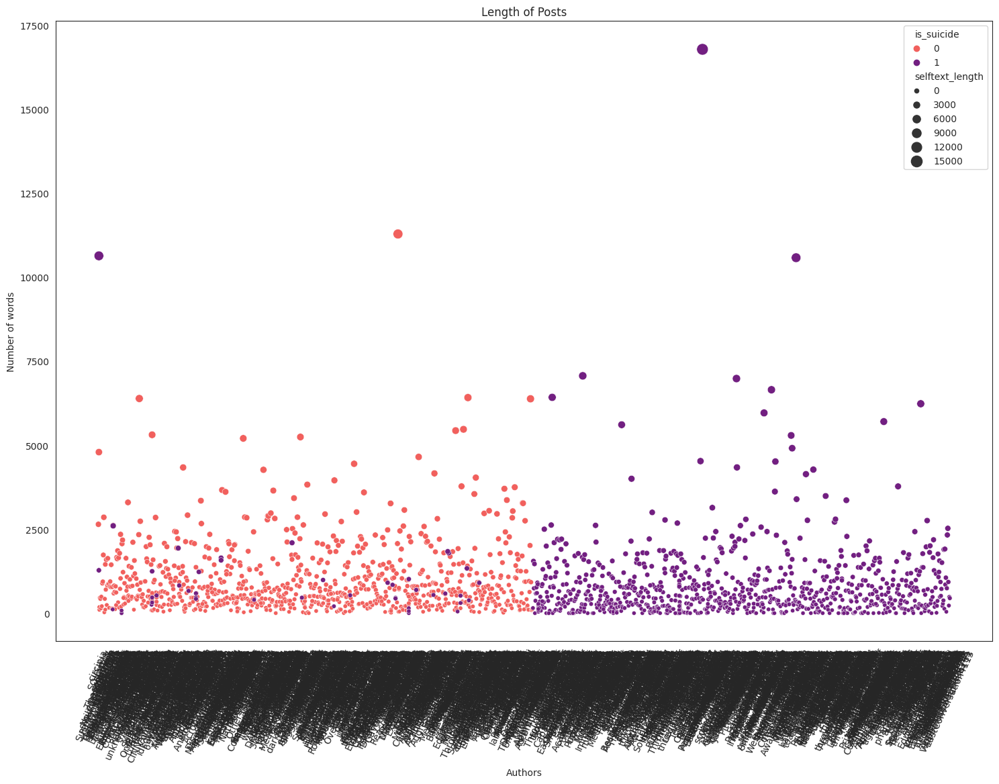

In [59]:
#CREATING A SCATTERPLOT TO VISUALISE LENGTH OF POSTS
sns.set_style("white")
plt.figure(figsize = (18, 12))
sns.scatterplot(data =combined_data,
               y = "selftext_length", 
               x = "author",
               hue = 'is_suicide', 
               palette = "magma_r",
               size = 'selftext_length',
               sizes=(20, 150));
plt.title("Length of Posts");
plt.xlabel("Authors");
plt.ylabel("Number of words");
plt.xticks(rotation=65);

In [60]:
#CREATING A megatext COLUMN
combined_data["megatext_clean"]=combined_data["author_clean"] + " " + combined_data["selftext_clean"]+ " " +combined_data["title_clean"]

In [61]:
#CREATING A DATAFRAME FOR SCATTERTEXT
scatter_data = combined_data[["megatext_clean", "is_suicide"]]
scatter_data["category"] = scatter_data["is_suicide"].map({0: "Depression", 1: "Suicide"})
scatter_data.tail()

<ipython-input-61-f180839eb3dd>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scatter_data["category"] = scatter_data["is_suicide"].map({0: "Depression", 1: "Suicide"})


,megatext_clean,is_suicide,category
1930,dont msg 1 conflicted come abusive household rent price area high move want separate parent leech onto take control life want better feel better take credit say amazing parenting behind closed door pretend proud act like care journey getting better want freedom life fucking expensive nowhere go broke still rely insurance stuff want see better even get slightest hint helped one created problem first place want love spite believe reason fixed sigh want feel better want love,1,Suicide
1931,ne erde kel jen wrote 1 month ago since lost shitty job im failing get driving license still anyone family say everything fault honestly think true future want end suffering everything suck,1,Suicide
1932,cry inside doe someone affect much doe every word say mean much care care doe even love stayed alive long hope relationship would really forever cant live forever feeling invalidated unloved feel unloved,1,Suicide
1933,east conversation 4113 want die afraid process pain want risk chance going hell either religious scared want good life also want let rot want sometimes therapist told health curing case probably learn live case life feel worth guess scared end feel like stuck limbo something know want anymore,1,Suicide
1934,joe complain much hate life fault ending dont gut pathetic genuinely considered finding random person asking kill even make look like suicide dont get trouble killing im everything know want die know 100 would content death cant get fucking embarrassing wish gut kill already,1,Suicide


In [62]:
#PARSING TEXT FOR SCATTERTEXT
nlp = st.whitespace_nlp_with_sentences
scatter_data.groupby("category").apply(lambda x: x.megatext_clean.apply(lambda x: len(x.split())).sum())
scatter_data['parsed'] = scatter_data.megatext_clean.apply(nlp)
scatter_data.tail()

<ipython-input-62-cf1421efc843>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scatter_data['parsed'] = scatter_data.megatext_clean.apply(nlp)


,megatext_clean,is_suicide,category,parsed
1930,dont msg 1 conflicted come abusive household rent price area high move want separate parent leech onto take control life want better feel better take credit say amazing parenting behind closed door pretend proud act like care journey getting better want freedom life fucking expensive nowhere go broke still rely insurance stuff want see better even get slightest hint helped one created problem first place want love spite believe reason fixed sigh want feel better want love,1,Suicide,"(dont, msg, 1, conflicted, come, abusive, household, rent, price, area, high, move, want, separate, parent, leech, onto, take, control, life, want, better, feel, better, take, credit, say, amazing, parenting, behind, closed, door, pretend, proud, act, like, care, journey, getting, better, want, freedom, life, fucking, expensive, nowhere, go, broke, still, rely, insurance, stuff, want, see, better, even, get, slightest, hint, helped, one, created, problem, first, place, want, love, spite, believe, reason, fixed, sigh, want, feel, better, want, love)"
1931,ne erde kel jen wrote 1 month ago since lost shitty job im failing get driving license still anyone family say everything fault honestly think true future want end suffering everything suck,1,Suicide,"(ne, erde, kel, jen, wrote, 1, month, ago, since, lost, shitty, job, im, failing, get, driving, license, still, anyone, family, say, everything, fault, honestly, think, true, future, want, end, suffering, everything, suck)"
1932,cry inside doe someone affect much doe every word say mean much care care doe even love stayed alive long hope relationship would really forever cant live forever feeling invalidated unloved feel unloved,1,Suicide,"(cry, inside, doe, someone, affect, much, doe, every, word, say, mean, much, care, care, doe, even, love, stayed, alive, long, hope, relationship, would, really, forever, cant, live, forever, feeling, invalidated, unloved, feel, unloved)"
1933,east conversation 4113 want die afraid process pain want risk chance going hell either religious scared want good life also want let rot want sometimes therapist told health curing case probably learn live case life feel worth guess scared end feel like stuck limbo something know want anymore,1,Suicide,"(east, conversation, 4113, want, die, afraid, process, pain, want, risk, chance, going, hell, either, religious, scared, want, good, life, also, want, let, rot, want, sometimes, therapist, told, health, curing, case, probably, learn, live, case, life, feel, worth, guess, scared, end, feel, like, stuck, limbo, something, know, want, anymore)"
1934,joe complain much hate life fault ending dont gut pathetic genuinely considered finding random person asking kill even make look like suicide dont get trouble killing im everything know want die know 100 would content death cant get fucking embarrassing wish gut kill already,1,Suicide,"(joe, complain, much, hate, life, fault, ending, dont, gut, pathetic, genuinely, considered, finding, random, person, asking, kill, even, make, look, like, suicide, dont, get, trouble, killing, im, everything, know, want, die, know, 100, would, content, death, cant, get, fucking, embarrassing, wish, gut, kill, already)"


In [63]:
#DEFINING A CORPUS FOR SCATTERTEXT VISUALISATION
corpus = st.CorpusFromParsedDocuments(scatter_data, category_col="category", parsed_col="parsed").build()

In [64]:
#CHECKING IF OUR NEWER COLUMNS INTRODUCED MISSING DATA INTO OUR DATASET
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1935 entries, 0 to 1934
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   title            1935 non-null   object
 1   selftext         1935 non-null   object
 2   author           1935 non-null   object
 3   num_comments     1935 non-null   int64 
 4   is_suicide       1935 non-null   int64 
 5   url              1935 non-null   object
 6   selftext_clean   1935 non-null   object
 7   title_clean      1935 non-null   object
 8   author_clean     1935 non-null   object
 9   selftext_length  1935 non-null   int64 
 10  title_length     1935 non-null   int64 
 11  megatext_clean   1935 non-null   object
dtypes: int64(4), object(8)
memory usage: 181.5+ KB


# Model Building

In this section, we will be using a Pipeline to score different classifier models like K-Nearest Neighbours and Multinomial Naive Bayes before finally settling on a final production model.

In [65]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 100)
sns.set_style("white")

from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

# IF YOU ARE MISSING "WordCloud":
# TRY INSTALLING VIA TERMINAL LIKE THIS: /anaconda3/bin/python -m pip install wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
# IF YOU ARE MISSING "wordninja":
# TRY INSTALLING VIA TERMINAL LIKE THIS: pip install wordninja
import wordninja

In [66]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1935 entries, 0 to 1934
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   title            1935 non-null   object
 1   selftext         1935 non-null   object
 2   author           1935 non-null   object
 3   num_comments     1935 non-null   int64 
 4   is_suicide       1935 non-null   int64 
 5   url              1935 non-null   object
 6   selftext_clean   1935 non-null   object
 7   title_clean      1935 non-null   object
 8   author_clean     1935 non-null   object
 9   selftext_length  1935 non-null   int64 
 10  title_length     1935 non-null   int64 
 11  megatext_clean   1935 non-null   object
dtypes: int64(4), object(8)
memory usage: 181.5+ KB


**Establishing a baseline score**

We will first calculate the baseline score for our models to "out-perform". A baseline score in the context of our project be the percentage of us getting it right if we predict that all our reddit posts are from the r/SuicideWatch subreddit.

In [67]:
#OUR BASELINE ACCURACY IS 50.35%
#BASELINE ACCURACY IS BASICALLY OUR SCORE IF WE GUESS EVERYTHING == 1
combined_data['is_suicide'].mean()

0.5054263565891473

**Selecting the best column to pick our features from**

Before moving forward to creating a production model, we will run a Count Vectorizer + Naive Bayes model on different columns and score them. This will help us pick which one that we will use to build more models on.

In [68]:
#DEFINING A FUNCTION TO SCORE MULTIPLE MODELS USING DIFFERENT COLS OF OUR DATASET

#PLEASE DEFINE THE FOLLOWING BEFORE RUNNING THE FUNCTION
# columns_list = ['column_1', "column_2", "column_3"]
# model = "CountVec + MultinomialNB"
# df_list=[] #THIS LIST SHOULD BE AN EMPTY LIST

#DEFINING THE FUNCTION
def multi_modelling(columns_list, model):
    for i in columns_list:
        #DEFINING X and y
        X = combined_data[i]
        y = combined_data['is_suicide']
        
        #TRAIN-TEST SPLIT
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)
        
        #INSTATIATING CVEC AND FITTING OUR TRAINING DATA INTO IT
        cvec = CountVectorizer()
        cvec.fit(X_train)
        
        #CREATING DATAFRAMES FROM X_train AND X_test
        X_train = pd.DataFrame(cvec.transform(X_train).todense(),
                               columns=cvec.get_feature_names_out())
        X_test = pd.DataFrame(cvec.transform(X_test).todense(),
                               columns=cvec.get_feature_names_out())
        
        #INSTATIATING AND FITTING MODEL
        nb = MultinomialNB()
        nb.fit(X_train,y_train)
        
        #GETTING PREDICTIONS FROM MODEL
        pred = nb.predict(X_test)
        
        #GETTING VALUES FROM A CONFUSION MATRIX
        tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()
        
        
        #CALCULATING AREA UNDER THE CURVE
        nb.predict_proba(X_test)
        pred_proba = [i[1] for i in nb.predict_proba(X_test)] 
        auc = roc_auc_score(y_test, pred_proba)

        #CREATING A DICTIONARY FROM THE CLASSIFICATION REPORT(WE'LL DRAW SOME METRICS FROM HERE)
        classi_dict = (classification_report(y_test,pred, output_dict=True))

        #CREATING A DICTIONARY CONTAINING OUR RESULTS
        model_results = {}
        model_results['series used (X)'] = i
        model_results['model'] = model
        model_results['AUC Score'] = auc
        model_results['precision']= classi_dict['weighted avg']['precision']
        model_results['recall (sensitivity)']= classi_dict['weighted avg']['recall']
        model_results['confusion matrix']={"TP": tp,"FP":fp, "TN": tn, "FN": fn}
        model_results['train accuracy'] = nb.score(X_train, y_train)
        model_results['test accuracy'] = nb.score(X_test, y_test)
        model_results['baseline accuracy']=0.5166
        model_results['specificity']= tn/(tn+fp)  
        model_results['f1-score']= classi_dict['weighted avg']['f1-score']
        #model_results['support']= classi_dict['weighted avg']['support']
        model_results
        df_list.append(model_results) 

    pd.set_option("display.max_colwidth", 50)
    return (pd.DataFrame(df_list)).round(2)

**Understanding our confusion matrix**
In the context of our project, these are what the parameters in our confusion matrix represent:

**True Positives (TP)** - We predict that an entry is from the r/SuicideWatch subreddit and we get it right. As we are seeking to identify suicide cases, our priority is to get as many of these!

**True Negatives (TN)** - We predict that an entry is from the r/depression subreddit and we get it right. This also means that we did well.

**False Positives (FP)** - We predict that an entry is from the r/SuicideWatch subreddit and we get it wrong. Needless to say, this is undesirable.

**False Negatives (FN)** - We predict a post comes from the r/depression subreddit, but it actually comes from r/SuicideWatch. The worst case scenario is this. That implies that we might be passing up an opportunity to intervene for someone who is considering suicide.

In [69]:
#CALLING THE FUNCTION ON OUR LIST OF COLUMNS
columns_list = ['selftext', "author", "title",'selftext_clean', "author_clean", "title_clean", "megatext_clean"]
model = "CountVec + MultinomialNB"
df_list=[]
multi_modelling(columns_list, model)

,series used (X),model,AUC Score,precision,recall (sensitivity),confusion matrix,train accuracy,test accuracy,baseline accuracy,specificity,f1-score
0,selftext,CountVec + MultinomialNB,0.73,0.69,0.69,"{'TP': 178, 'FP': 81, 'TN': 158, 'FN': 67}",0.90,0.69,0.52,0.66,0.69
1,author,CountVec + MultinomialNB,0.58,0.61,0.54,"{'TP': 233, 'FP': 212, 'TN': 27, 'FN': 12}",0.98,0.54,0.52,0.11,0.44
2,title,CountVec + MultinomialNB,0.68,0.61,0.61,"{'TP': 160, 'FP': 105, 'TN': 134, 'FN': 85}",0.83,0.61,0.52,0.56,0.61
3,selftext_clean,CountVec + MultinomialNB,0.73,0.68,0.68,"{'TP': 174, 'FP': 83, 'TN': 156, 'FN': 71}",0.90,0.68,0.52,0.65,0.68
4,author_clean,CountVec + MultinomialNB,0.56,0.52,0.52,"{'TP': 178, 'FP': 164, 'TN': 75, 'FN': 67}",0.96,0.52,0.52,0.31,0.50
5,title_clean,CountVec + MultinomialNB,0.67,0.60,0.60,"{'TP': 155, 'FP': 102, 'TN': 137, 'FN': 90}",0.83,0.60,0.52,0.57,0.60
6,megatext_clean,CountVec + MultinomialNB,0.76,0.72,0.72,"{'TP': 183, 'FP': 72, 'TN': 167, 'FN': 62}",0.94,0.72,0.52,0.70,0.72


**Final choice made: megatext_clean as our "Production Column"**

Based on a combination of scores from our modelling exercise above, we will proceed with megatext_clean -- a combination of our cleaned titles, usernames and posts -- as the column we will use to draw features from. Some reasons why:

**Generalising Well** - The model using megatext_clean's test set scored a 0.67 (the joint highest) while its training set score a 0.95.

**High ROC Area Under Curve score** - As our classes are largely balanced, it is suitable to use AUC Scores as a metric to measure the quality of our model's predictions. Our top choice performs best there.

**Best recall/sensitivity score** - This score measures the ratio of the correctly positive-labeled(is in r/SuicideWatch) by our program to all who are truly in r/SuicideWatch. As that is the target of our project, that the model performed well for this metric is important(and perhaps, most important) to us.

**False Negatives (FN)** - We predict that an entry is from the r/depression subreddit and BUT the entry is actually from r/SuicideWatch. This is the worst outcome. That means we might be missing out on helping someone who might be thinking about ending their life.

**The search for a production model**

Inspired by our earlier function, we will create a similar function that will run multiple permutations of models with Count, Hashing and TFID Vectorizers. The resulting metrics will be held neatly in a dataframe.

In [70]:
# DEFINING A FUNCTION THAT WILL RUN MULTIPLE MODELS AND GRIDSEARCH FOR BEST PARAMETERS

def gridsearch_multi(steps_titles, steps_list, pipe_params):
    
    #DEFINING X and y
    X = combined_data["megatext_clean"]
    y = combined_data['is_suicide']
    #TRAIN-TEST SPLIT
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)
    # DATAFRAME TO DISPLAY RESULTS
    gs_results = pd.DataFrame(columns=['model','AUC Score', 'precision', 'recall (sensitivity)', 
                                       'best_params', 'best score', 'confusion matrix', 
                                       'train_accuracy','test_accuracy','baseline_accuracy',
                                       'specificity', 'f1-score'])

    # FOR LOOP THROUGH STEPS LIST
    for i in range(len(steps_list)):
        # INSTATIATE PIPELINE
        pipe = Pipeline(steps=steps_list[i])
        # INSTANTIATE GRIDSEARCHCV WITH PARAMETER ARGUMENT
        gs = GridSearchCV(pipe, pipe_params[i], cv=3) 
        gs.fit(X_train, y_train)
        
        #GETTING PREDICTIONS FROM MODEL
        pred = gs.predict(X_test)
        
        # DEFINE CONFUSION MATRIX ELEMENTS
        tn, fp, fn, tp = confusion_matrix(y_test, gs.predict(X_test)).ravel() 
        
        #CREATING A DICTIONARY FROM THE CLASSIFICATION REPORT(WE'LL DRAW SOME METRICS FROM HERE)
        classi_dict = (classification_report(y_test,pred, output_dict=True))
        
        #CALCULATING AREA UNDER THE CURVE
        gs.predict_proba(X_test)
        pred_proba = [i[1] for i in gs.predict_proba(X_test)] 
        auc = roc_auc_score(y_test, pred_proba)
        
        #DEFINE DATAFRAME COLUMNS
        model_results = {}
        model_results['model'] = steps_titles[i]
        model_results['AUC Score'] = auc
        model_results['precision']= classi_dict['weighted avg']['precision']
        model_results['recall (sensitivity)']= classi_dict['weighted avg']['recall']
        model_results['best params'] = gs.best_params_
        model_results['best score'] = gs.best_score_
        model_results['confusion matrix']={"TP": tp,"FP":fp, "TN": tn, "FN": fn}
        model_results['train accuracy'] = gs.score(X_train, y_train)
        model_results['test accuracy'] = gs.score(X_test, y_test)
        model_results['baseline accuracy'] = 0.5166
        
        model_results['specificity']= tn/(tn+fp)  
        model_results['f1-score']= classi_dict['weighted avg']['f1-score']


        #APPEND RESULTS TO A NICE DATAFRAME
        df_list.append(model_results) 
        pd.set_option("display.max_colwidth", 200)
    return (pd.DataFrame(df_list)).round(2)

In [71]:
#USING THE FUNCTION WITH COUNT VECTORIZOR

# EMPTY LIST THAT WILL HOLD RESULTS
df_list=[]

# LIST OF MODELS
steps_titles = ['cvec+ multi_nb','cvec + ss + knn','cvec + ss + logreg']

# CODE FOR PIPELINE TO INSTATIATE MODELS
steps_list = [ 
    [('cv', CountVectorizer()),('multi_nb', MultinomialNB())],
    [('cv', CountVectorizer()),('scaler', StandardScaler(with_mean=False)),('knn', KNeighborsClassifier())], 
    [('cv', CountVectorizer()),('scaler', StandardScaler(with_mean=False)),('logreg', LogisticRegression())]
]

# LIST OF PARAMETER DICTIONARIES
pipe_params = [
    {'cv__stop_words':['english'], 'cv__ngram_range':[(1,1),(1,2)],'cv__max_features': [20, 30, 50],'cv__min_df': [2, 3],'cv__max_df': [.2, .25, .3]},
    {'cv__stop_words':['english'], 'cv__ngram_range':[(1,1),(1,2)],'cv__max_features': [20, 30, 50],'cv__min_df': [2, 3],'cv__max_df': [.2, .25, .3]},
    {'cv__stop_words':['english'], 'cv__ngram_range':[(1,1),(1,2)],'cv__max_features': [20, 30, 50],'cv__min_df': [2, 3],'cv__max_df': [.2, .25, .3]}
]   

#RUNNING THE FUNCTION
gridsearch_multi(steps_titles, steps_list, pipe_params)

,model,AUC Score,precision,recall (sensitivity),best params,best score,confusion matrix,train accuracy,test accuracy,baseline accuracy,specificity,f1-score
0,cvec+ multi_nb,0.68,0.63,0.63,"{'cv__max_df': 0.3, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 2), 'cv__stop_words': 'english'}",0.68,"{'TP': 163, 'FP': 96, 'TN': 143, 'FN': 82}",0.69,0.63,0.52,0.60,0.63
1,cvec + ss + knn,0.60,0.57,0.57,"{'cv__max_df': 0.25, 'cv__max_features': 20, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.61,"{'TP': 145, 'FP': 106, 'TN': 133, 'FN': 100}",0.71,0.57,0.52,0.56,0.57
2,cvec + ss + logreg,0.68,0.66,0.65,"{'cv__max_df': 0.25, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.68,"{'TP': 190, 'FP': 112, 'TN': 127, 'FN': 55}",0.71,0.65,0.52,0.53,0.65


In [72]:
#USING THE FUNCTION WITH TFID VECTORIZOR

# LIST OF MODELS
steps_titles = ['tvec + multi_nb','tvec + ss + knn','tvec + ss + logreg']

# CODE FOR PIPELINE TO INSTATIATE MODELS
steps_list = [ 
    [('tv', TfidfVectorizer()),('multi_nb', MultinomialNB())],
    [('tv', TfidfVectorizer()),('scaler', StandardScaler(with_mean=False)),('knn', KNeighborsClassifier())], 
    [('tv', TfidfVectorizer()),('scaler', StandardScaler(with_mean=False)),('logreg', LogisticRegression())]
]

# LIST OF PARAMETER DICTIONARIES
pipe_params = [
    {'tv__stop_words':['english'], 'tv__ngram_range':[(1,1),(1,2)],'tv__max_features': [20, 30, 50],'tv__min_df': [2, 3],'tv__max_df': [.2, .25, .3]},
    {'tv__stop_words':['english'], 'tv__ngram_range':[(1,1),(1,2)],'tv__max_features': [20, 30, 50],'tv__min_df': [2, 3],'tv__max_df': [.2, .25, .3]},
    {'tv__stop_words':['english'], 'tv__ngram_range':[(1,1),(1,2)],'tv__max_features': [20, 30, 50],'tv__min_df': [2, 3],'tv__max_df': [.2, .25, .3]}
]   

#RUNNING THE FUNCTION
gridsearch_multi(steps_titles, steps_list, pipe_params)

,model,AUC Score,precision,recall (sensitivity),best params,best score,confusion matrix,train accuracy,test accuracy,baseline accuracy,specificity,f1-score
0,cvec+ multi_nb,0.68,0.63,0.63,"{'cv__max_df': 0.3, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 2), 'cv__stop_words': 'english'}",0.68,"{'TP': 163, 'FP': 96, 'TN': 143, 'FN': 82}",0.69,0.63,0.52,0.60,0.63
1,cvec + ss + knn,0.60,0.57,0.57,"{'cv__max_df': 0.25, 'cv__max_features': 20, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.61,"{'TP': 145, 'FP': 106, 'TN': 133, 'FN': 100}",0.71,0.57,0.52,0.56,0.57
2,cvec + ss + logreg,0.68,0.66,0.65,"{'cv__max_df': 0.25, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.68,"{'TP': 190, 'FP': 112, 'TN': 127, 'FN': 55}",0.71,0.65,0.52,0.53,0.65
3,tvec + multi_nb,0.70,0.64,0.64,"{'tv__max_df': 0.3, 'tv__max_features': 50, 'tv__min_df': 2, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.68,"{'TP': 157, 'FP': 84, 'TN': 155, 'FN': 88}",0.70,0.64,0.52,0.65,0.64
4,tvec + ss + knn,0.61,0.57,0.57,"{'tv__max_df': 0.25, 'tv__max_features': 20, 'tv__min_df': 2, 'tv__ngram_range': (1, 1), 'tv__stop_words': 'english'}",0.60,"{'TP': 151, 'FP': 115, 'TN': 124, 'FN': 94}",0.71,0.57,0.52,0.52,0.57
5,tvec + ss + logreg,0.70,0.65,0.65,"{'tv__max_df': 0.2, 'tv__max_features': 50, 'tv__min_df': 3, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.67,"{'TP': 171, 'FP': 97, 'TN': 142, 'FN': 74}",0.71,0.65,0.52,0.59,0.65


In [73]:
#USING THE FUNCTION WITH HASHING VECTORIZOR

# LIST OF MODELS
steps_titles = ['hvec + multi_nb','hvec + ss + knn','hvec + ss + logreg']

# CODE FOR PIPELINE TO INSTATIATE MODELS
steps_list = [ 
    [('hv', HashingVectorizer(alternate_sign=False)),('multi_nb', MultinomialNB())],
    [('hv', HashingVectorizer(alternate_sign=False)),('scaler', StandardScaler(with_mean=False)),('knn', KNeighborsClassifier())], 
    [('hv', HashingVectorizer(alternate_sign=False)),('scaler', StandardScaler(with_mean=False)),('logreg', LogisticRegression())]
]

# LIST OF PARAMETER DICTIONARIES
pipe_params = [
    {'hv__stop_words':['english'], 'hv__ngram_range':[(1,1),(1,2)]},
    {'hv__stop_words':['english'], 'hv__ngram_range':[(1,1),(1,2)]},
    {'hv__stop_words':['english'], 'hv__ngram_range':[(1,1),(1,2)]}
]   

#RUNNING THE FUNCTION
gridsearch_multi(steps_titles, steps_list, pipe_params)

/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _che

,model,AUC Score,precision,recall (sensitivity),best params,best score,confusion matrix,train accuracy,test accuracy,baseline accuracy,specificity,f1-score
0,cvec+ multi_nb,0.68,0.63,0.63,"{'cv__max_df': 0.3, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 2), 'cv__stop_words': 'english'}",0.68,"{'TP': 163, 'FP': 96, 'TN': 143, 'FN': 82}",0.69,0.63,0.52,0.60,0.63
1,cvec + ss + knn,0.60,0.57,0.57,"{'cv__max_df': 0.25, 'cv__max_features': 20, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.61,"{'TP': 145, 'FP': 106, 'TN': 133, 'FN': 100}",0.71,0.57,0.52,0.56,0.57
2,cvec + ss + logreg,0.68,0.66,0.65,"{'cv__max_df': 0.25, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.68,"{'TP': 190, 'FP': 112, 'TN': 127, 'FN': 55}",0.71,0.65,0.52,0.53,0.65
3,tvec + multi_nb,0.70,0.64,0.64,"{'tv__max_df': 0.3, 'tv__max_features': 50, 'tv__min_df': 2, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.68,"{'TP': 157, 'FP': 84, 'TN': 155, 'FN': 88}",0.70,0.64,0.52,0.65,0.64
4,tvec + ss + knn,0.61,0.57,0.57,"{'tv__max_df': 0.25, 'tv__max_features': 20, 'tv__min_df': 2, 'tv__ngram_range': (1, 1), 'tv__stop_words': 'english'}",0.60,"{'TP': 151, 'FP': 115, 'TN': 124, 'FN': 94}",0.71,0.57,0.52,0.52,0.57
5,tvec + ss + logreg,0.70,0.65,0.65,"{'tv__max_df': 0.2, 'tv__max_features': 50, 'tv__min_df': 3, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.67,"{'TP': 171, 'FP': 97, 'TN': 142, 'FN': 74}",0.71,0.65,0.52,0.59,0.65
6,hvec + multi_nb,0.76,0.67,0.65,"{'hv__ngram_range': (1, 2), 'hv__stop_words': 'english'}",0.69,"{'TP': 123, 'FP': 48, 'TN': 191, 'FN': 122}",0.94,0.65,0.52,0.80,0.64
7,hvec + ss + knn,0.51,0.75,0.51,"{'hv__ngram_range': (1, 1), 'hv__stop_words': 'english'}",0.51,"{'TP': 245, 'FP': 238, 'TN': 1, 'FN': 0}",0.51,0.51,0.52,0.00,0.34
8,hvec + ss + logreg,0.71,0.67,0.67,"{'hv__ngram_range': (1, 2), 'hv__stop_words': 'english'}",0.64,"{'TP': 158, 'FP': 75, 'TN': 164, 'FN': 87}",1.00,0.67,0.52,0.69,0.67


**Narrowing down to two models**
The Hashing Vectorizer + Multinomial Naive Bayes model out-performed other models on multiple metrics. Especially our much-prized AUC score(0.77) and the recall score(which measures our model's ability to predict True Positives well). Another notable performer is the TFID Vectorizer + Multinomial Naive Bayes combination. Apart from the joint-second-highest AUC score of 0.73, its consistent performance on both the test and training sets showed that the model generalises well.

**Next Step: Tuning Hyperparameters** - We'll now move on to make further moves to tweak our hyperparameters for both of these models.

In [74]:
#TUNING OUR HYPERPARAMETERS
#USING THE FUNCTION ON OUR TOP TWO MODELS

# LIST OF MODELS
steps_titles = ['hvec + multi_nb(tuning)','tvec + multi_nb(tuning)']

# CODE FOR PIPELINE TO INSTATIATE MODELS
steps_list = [ 
    [('hv', HashingVectorizer(alternate_sign=False)),('multi_nb', MultinomialNB())],
    [('tv', TfidfVectorizer()),('multi_nb', MultinomialNB())]
]

# LIST OF PARAMETER DICTIONARIES
pipe_params = [
    {'hv__stop_words':['english'], 'hv__ngram_range':[(1,1),(1,2),(1,3)], 'hv__n_features': [50, 150, 300, 500, 800, 1000]},
    {'tv__stop_words':['english'], 'tv__ngram_range':[(1,1),(1,2),(1,3)],'tv__max_features': [20, 30, 50, 70, 100],'tv__min_df': [2, 3],'tv__max_df': [.2, .25, .3, .35,.4]},
]   

#RUNNING THE FUNCTION
gridsearch_multi(steps_titles, steps_list, pipe_params)

,model,AUC Score,precision,recall (sensitivity),best params,best score,confusion matrix,train accuracy,test accuracy,baseline accuracy,specificity,f1-score
0,cvec+ multi_nb,0.68,0.63,0.63,"{'cv__max_df': 0.3, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 2), 'cv__stop_words': 'english'}",0.68,"{'TP': 163, 'FP': 96, 'TN': 143, 'FN': 82}",0.69,0.63,0.52,0.60,0.63
1,cvec + ss + knn,0.60,0.57,0.57,"{'cv__max_df': 0.25, 'cv__max_features': 20, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.61,"{'TP': 145, 'FP': 106, 'TN': 133, 'FN': 100}",0.71,0.57,0.52,0.56,0.57
2,cvec + ss + logreg,0.68,0.66,0.65,"{'cv__max_df': 0.25, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.68,"{'TP': 190, 'FP': 112, 'TN': 127, 'FN': 55}",0.71,0.65,0.52,0.53,0.65
3,tvec + multi_nb,0.70,0.64,0.64,"{'tv__max_df': 0.3, 'tv__max_features': 50, 'tv__min_df': 2, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.68,"{'TP': 157, 'FP': 84, 'TN': 155, 'FN': 88}",0.70,0.64,0.52,0.65,0.64
4,tvec + ss + knn,0.61,0.57,0.57,"{'tv__max_df': 0.25, 'tv__max_features': 20, 'tv__min_df': 2, 'tv__ngram_range': (1, 1), 'tv__stop_words': 'english'}",0.60,"{'TP': 151, 'FP': 115, 'TN': 124, 'FN': 94}",0.71,0.57,0.52,0.52,0.57
5,tvec + ss + logreg,0.70,0.65,0.65,"{'tv__max_df': 0.2, 'tv__max_features': 50, 'tv__min_df': 3, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.67,"{'TP': 171, 'FP': 97, 'TN': 142, 'FN': 74}",0.71,0.65,0.52,0.59,0.65
6,hvec + multi_nb,0.76,0.67,0.65,"{'hv__ngram_range': (1, 2), 'hv__stop_words': 'english'}",0.69,"{'TP': 123, 'FP': 48, 'TN': 191, 'FN': 122}",0.94,0.65,0.52,0.80,0.64
7,hvec + ss + knn,0.51,0.75,0.51,"{'hv__ngram_range': (1, 1), 'hv__stop_words': 'english'}",0.51,"{'TP': 245, 'FP': 238, 'TN': 1, 'FN': 0}",0.51,0.51,0.52,0.00,0.34
8,hvec + ss + logreg,0.71,0.67,0.67,"{'hv__ngram_range': (1, 2), 'hv__stop_words': 'english'}",0.64,"{'TP': 158, 'FP': 75, 'TN': 164, 'FN': 87}",1.00,0.67,0.52,0.69,0.67
9,hvec + multi_nb(tuning),0.72,0.65,0.65,"{'hv__n_features': 800, 'hv__ngram_range': (1, 1), 'hv__stop_words': 'english'}",0.69,"{'TP': 154, 'FP': 77, 'TN': 162, 'FN': 91}",0.80,0.65,0.52,0.68,0.65


In [75]:
#THE SCORES WERE CLOSE! LET'S DO FINE-TUNE IT JUST ONE MORE TIME
#TUNING OUR HYPERPARAMETERS PART II
#USING THE FUNCTION ON OUR TOP TWO MODELS

# LIST OF MODELS
steps_titles = ['hvec + multi_nb (tuning_2)','tvec + multi_nb (tuning_2)']

# CODE FOR PIPELINE TO INSTATIATE MODELS
steps_list = [ 
    [('hv', HashingVectorizer(alternate_sign=False)),('multi_nb', MultinomialNB())],
    [('tv', TfidfVectorizer()),('multi_nb', MultinomialNB())]
]

# LIST OF PARAMETER DICTIONARIES
pipe_params = [
    {'hv__stop_words':['english'], 'hv__ngram_range':[(1,1)], 'hv__n_features': [1000, 1200, 1400, 2000]},
    {'tv__stop_words':['english'], 'tv__ngram_range':[(1,1),(1,2),(1,3)],'tv__max_features': [60, 65, 70, 75, 80],'tv__min_df': [1, 2, 3],'tv__max_df': [.4, .45,.5,.55, .6]},
]   

#RUNNING THE FUNCTION
gridsearch_multi(steps_titles, steps_list, pipe_params)

,model,AUC Score,precision,recall (sensitivity),best params,best score,confusion matrix,train accuracy,test accuracy,baseline accuracy,specificity,f1-score
0,cvec+ multi_nb,0.68,0.63,0.63,"{'cv__max_df': 0.3, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 2), 'cv__stop_words': 'english'}",0.68,"{'TP': 163, 'FP': 96, 'TN': 143, 'FN': 82}",0.69,0.63,0.52,0.60,0.63
1,cvec + ss + knn,0.60,0.57,0.57,"{'cv__max_df': 0.25, 'cv__max_features': 20, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.61,"{'TP': 145, 'FP': 106, 'TN': 133, 'FN': 100}",0.71,0.57,0.52,0.56,0.57
2,cvec + ss + logreg,0.68,0.66,0.65,"{'cv__max_df': 0.25, 'cv__max_features': 50, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': 'english'}",0.68,"{'TP': 190, 'FP': 112, 'TN': 127, 'FN': 55}",0.71,0.65,0.52,0.53,0.65
3,tvec + multi_nb,0.70,0.64,0.64,"{'tv__max_df': 0.3, 'tv__max_features': 50, 'tv__min_df': 2, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.68,"{'TP': 157, 'FP': 84, 'TN': 155, 'FN': 88}",0.70,0.64,0.52,0.65,0.64
4,tvec + ss + knn,0.61,0.57,0.57,"{'tv__max_df': 0.25, 'tv__max_features': 20, 'tv__min_df': 2, 'tv__ngram_range': (1, 1), 'tv__stop_words': 'english'}",0.60,"{'TP': 151, 'FP': 115, 'TN': 124, 'FN': 94}",0.71,0.57,0.52,0.52,0.57
5,tvec + ss + logreg,0.70,0.65,0.65,"{'tv__max_df': 0.2, 'tv__max_features': 50, 'tv__min_df': 3, 'tv__ngram_range': (1, 2), 'tv__stop_words': 'english'}",0.67,"{'TP': 171, 'FP': 97, 'TN': 142, 'FN': 74}",0.71,0.65,0.52,0.59,0.65
6,hvec + multi_nb,0.76,0.67,0.65,"{'hv__ngram_range': (1, 2), 'hv__stop_words': 'english'}",0.69,"{'TP': 123, 'FP': 48, 'TN': 191, 'FN': 122}",0.94,0.65,0.52,0.80,0.64
7,hvec + ss + knn,0.51,0.75,0.51,"{'hv__ngram_range': (1, 1), 'hv__stop_words': 'english'}",0.51,"{'TP': 245, 'FP': 238, 'TN': 1, 'FN': 0}",0.51,0.51,0.52,0.00,0.34
8,hvec + ss + logreg,0.71,0.67,0.67,"{'hv__ngram_range': (1, 2), 'hv__stop_words': 'english'}",0.64,"{'TP': 158, 'FP': 75, 'TN': 164, 'FN': 87}",1.00,0.67,0.52,0.69,0.67
9,hvec + multi_nb(tuning),0.72,0.65,0.65,"{'hv__n_features': 800, 'hv__ngram_range': (1, 1), 'hv__stop_words': 'english'}",0.69,"{'TP': 154, 'FP': 77, 'TN': 162, 'FN': 91}",0.80,0.65,0.52,0.68,0.65


In [76]:
#DEFINING A FUNCTION TO VISUALISE MOST USED WORDS
def TF_IDF_most_used_words(category_string, data_series, palette, image_mask):
    #CHECKING OUT COMMON WORDS IN r/SuicideWatch USING TVEC
    tvec_optimised = TfidfVectorizer(max_df= 0.5, max_features=70, min_df=2, ngram_range=(1, 3),stop_words = 'english')
    tvec_optimised.fit(data_series)
    #CREATING A DATAFRAME OF EXTRACTED WORDS
    created_df = pd.DataFrame(tvec_optimised.transform(data_series).todense(),
                              columns=tvec_optimised.get_feature_names_out())
    total_words = created_df.sum(axis=0)
    
    #<<<WORDCLOUD>>>
    #CREATING A LONG STRING OF WORDS FOR THE WORD CLOUD MODULE
    top_40_words = total_words.sort_values(ascending = False).head(40)
    top_40_words_df = pd.DataFrame(top_40_words)
    top_words_cloud_df = top_40_words_df.reset_index()
    top_words_cloud_df.columns = ["words", "count"]
    one_string_list = []
    for i in range(len(top_words_cloud_df)):
        one_string = (top_words_cloud_df["words"][i] + " ")* (top_words_cloud_df["count"][i]).astype(int)
        one_string_list.append(one_string)
    long_string = " ".join(string for string in one_string_list)
    #print(long_string)
    # CREATING A WORD CLOUD IMAGE
    mask = np.array(Image.open(image_mask))
    wordcloud = WordCloud(repeat=True, collocations=False,min_font_size=2, max_font_size= 80, max_words= 10000, background_color= "white",colormap= palette,  mask= mask).generate(long_string)
    # DISPLAY IT
    #plt.axis("off")
    plt.figure(figsize = (20, 20), dpi=300)
    plt.title('\n{}\n'.format(category_string), fontsize=22)
    #plt.imshow(wordcloud, interpolation='bilinear') 
    image_colors = ImageColorGenerator(mask) #THIS MAKES THE WORDCLOUD RESPOND TO THE COLOURS IN THE MASK
    plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
    #<<<BARPLOT>>>
    #CREATING A FINAL DATAFRAME OF THE TOP 20 WORDS
    top_20_words = total_words.sort_values(ascending = False).head(20)
    top_20_words_df = pd.DataFrame(top_20_words, columns = ["count"])
    #PLOTTING THE COUNT OF THE TOP 20 WORDS
    sns.set_style("white")
    plt.figure(figsize = (15, 8), dpi=300)
    ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)
    
    plt.xlabel("Count", fontsize=9)
    plt.ylabel('Common Words in {}'.format(category_string), fontsize=9)
    plt.yticks(rotation=-5)

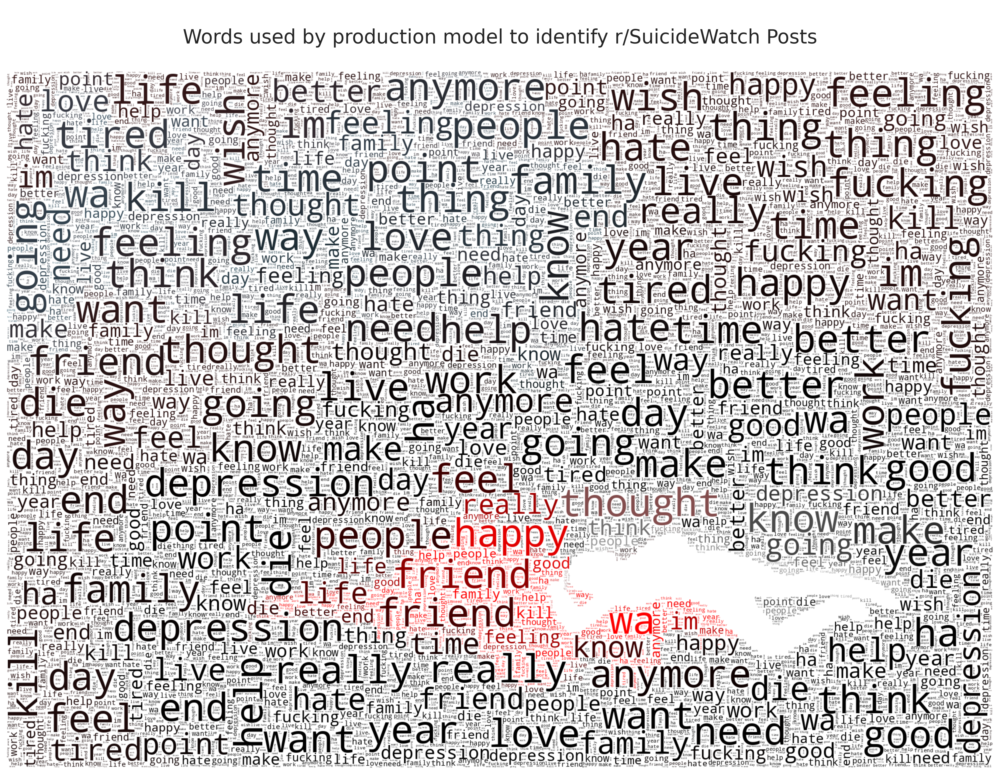

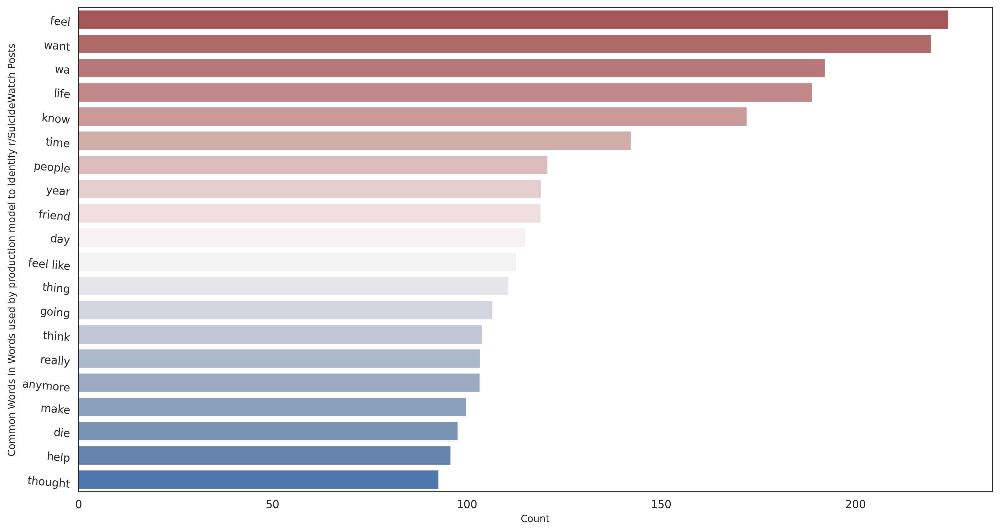

In [77]:
#CALLING THE FUNCTION ON OUR X FEATURES
TF_IDF_most_used_words("Words used by production model to identify r/SuicideWatch Posts", combined_data["megatext_clean"], "vlag_r", image_mask="/content/ending_mask_8.png")

# Model evaluation and possible future developments

**Top Words picked by TF-IDF Vectorizer** - It is important to note that the Vectorizer weighted "feel" higher than "want" although (as seen in our earlier EDA), "want" appeared more times than "feel" in suicide posts. This is probablly because TF-IDF "penalises" words that appear too much. Nonetheless, this set of words might be a good starting point to build other models that might be able to predict the presence of suicidal individuals in, say a subreddit for teachers.
**Understanding our False Negatives** - In our barplot showing the top words in our false negatives, we can see many similar words to those that our model is prioritising. To improve our model, we need to use more robust textual analysis to lower the instances of false negatives and this will prevent individuals at risk of suicide from falling through the cracks.
**Suicide without Depression** - One of the biggest limitations of this project is that we only looked at suicidal tendencies in the context of depression. It is important to note that suicides happen to people without depression too. Thus, future studies can focus on the wider population.
**Double-Posting Phenomenon** - In our exploratory data analysis, we noticed more about 26 instances of individuals posting on both subreddits. The example we looked at was u/thathumbletrashcan posted on r/depression on March 4th that "I don't want to die, but I don't want to live anymore" . A day later, u/thathumbletrashcan visits the r/SuicideWatch forum and posts "I've finally grown the balls to fulfil my plan......all of you won't have to deal with me again." Social psychologist Roy Baumeister postulates in his “Suicide as Escape from Self” theory thata person descends into the pit of self-extinction in six stages. Studying double-posting through the lens of Baumeister's theory might yield links to stage-based progression amongst our redditors.
**Looking into Male Suicides** - According to Samaritans of Singapore, males account for more than 71% of all suicides in 2018. This is consistent with our EDA findings of male-signifiers in usernames. Future projects can dive deeper into suicide amongst males. This could possibly be relevant for companies in male-dominated, high-stress industries like oil/gas, banking and tech.
**Complexity of Depression** - Depression is complex and layered. Future development on our model might be aided by working with someone with domain knowledge, who can help us with filtering out factors that might be linked to other conditions like self-harm/OCD/Anxiety?